In [1]:
import torch
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from functions.running import one_run, plot_results, plot_running_time
import random

In [2]:
def seed_everything(seed=0):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

def run(X, y, dataname):
    for init_type in ['he', 'xavier', 'orthogonal']:
        input_dim = X.shape[1]
        epochs = 200
        batch_size = 64
        n_layer = 5
        dataname_ = dataname + str(n_layer) + init_type
        nruns = 10
        res = []
        training_time = []
        for i in range(nruns):
            seed_everything(seed = i)
            res_one_run, training_time_one_run = one_run(input_dim, init_type, X, y, epochs, batch_size, n_layer)
            res.append(res_one_run)
            training_time.append(training_time_one_run)
        res = np.array(res)
        training_time = np.array(training_time)
        mean_all_run = np.mean(res, axis = 0)
        training_time_mean_all_run = np.mean(training_time, axis = 0)
        plot_results(dataname_, mean_all_run, output_dir=f"output/img")
        if not os.path.exists(f"output/res"):
            os.makedirs(f"output/res")
        np.save(f"output/res/"+dataname_, res)

        plot_running_time(dataname_+"_time", training_time_mean_all_run, output_dir=f"output/img")
        if not os.path.exists(f"output/time"):
            os.makedirs(f"output/time")
        np.save(f"output/time/"+dataname_, training_time)


# Heart

   0   1   2   3   4   5   6   7   8   9   ...  35  36  37  38  39  40  41  \
0   1  59  52  70  67  73  66  72  61  58  ...  66  56  62  56  72  62  74   
1   1  72  62  69  67  78  82  74  65  69  ...  65  71  63  60  69  73  67   
2   1  71  62  70  64  67  64  79  65  70  ...  73  70  66  65  64  55  61   
3   1  69  71  70  78  61  63  67  65  59  ...  61  61  66  65  72  73  68   
4   1  70  66  61  66  61  58  69  69  72  ...  67  69  70  66  70  64  60   

   42  43  44  
0  74  64  67  
1  71  56  58  
2  41  51  46  
3  68  59  63  
4  55  49  41  

[5 rows x 45 columns]
(267, 44)
55
212
23
Training with PCA-initialized NN...
Number of PCA components: 23
Epoch 1/30, Training Loss: 0.6093, Testing Accuracy: 0.8148, Training Time: 0.0812
Epoch 2/30, Training Loss: 0.5073, Testing Accuracy: 0.8148, Training Time: 0.0887
Epoch 3/30, Training Loss: 0.4427, Testing Accuracy: 0.7531, Training Time: 0.0943
Epoch 4/30, Training Loss: 0.4030, Testing Accuracy: 0.7901, Training Time: 0.

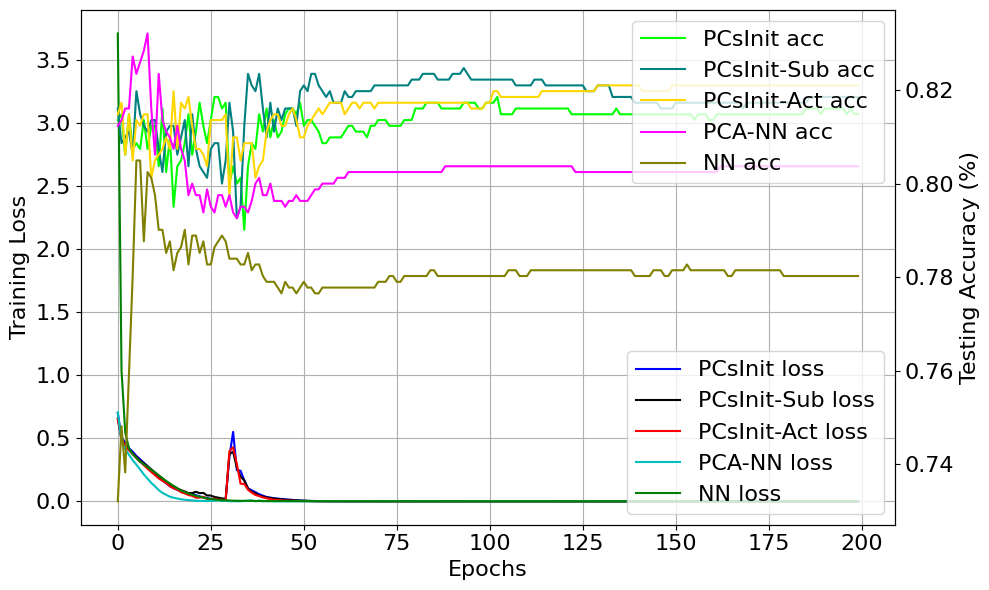

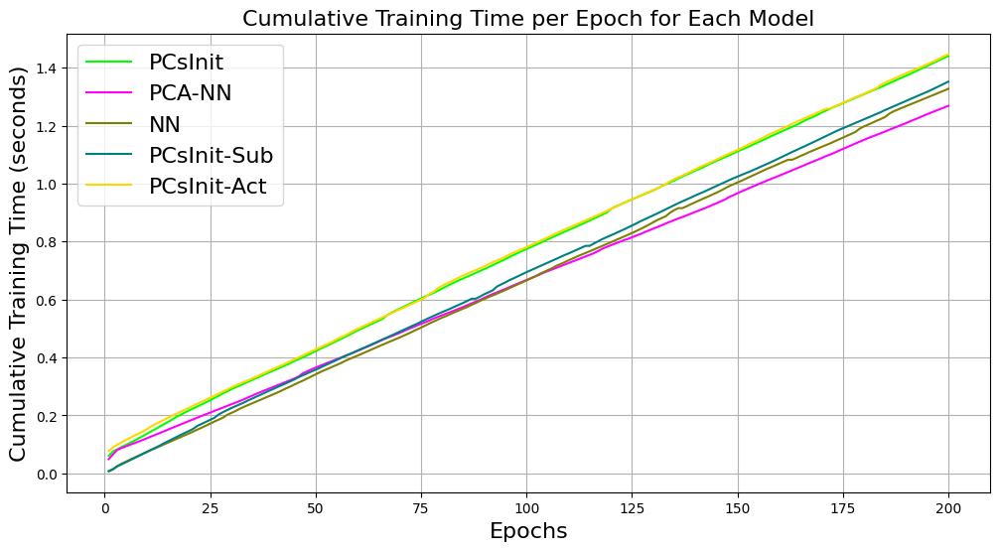

23
Training with PCA-initialized NN...
Number of PCA components: 23
Epoch 1/30, Training Loss: 0.6267, Testing Accuracy: 0.8148, Training Time: 0.0898
Epoch 2/30, Training Loss: 0.5347, Testing Accuracy: 0.8148, Training Time: 0.0978
Epoch 3/30, Training Loss: 0.4897, Testing Accuracy: 0.8148, Training Time: 0.1061
Epoch 4/30, Training Loss: 0.4525, Testing Accuracy: 0.8148, Training Time: 0.1133
Epoch 5/30, Training Loss: 0.4053, Testing Accuracy: 0.8148, Training Time: 0.1229
Epoch 6/30, Training Loss: 0.3671, Testing Accuracy: 0.8025, Training Time: 0.1298
Epoch 7/30, Training Loss: 0.3487, Testing Accuracy: 0.8025, Training Time: 0.1388
Epoch 8/30, Training Loss: 0.3150, Testing Accuracy: 0.8272, Training Time: 0.1465
Epoch 9/30, Training Loss: 0.3013, Testing Accuracy: 0.8519, Training Time: 0.1563
Epoch 10/30, Training Loss: 0.2649, Testing Accuracy: 0.8642, Training Time: 0.1647
Epoch 11/30, Training Loss: 0.2300, Testing Accuracy: 0.8395, Training Time: 0.1706
Epoch 12/30, Trai

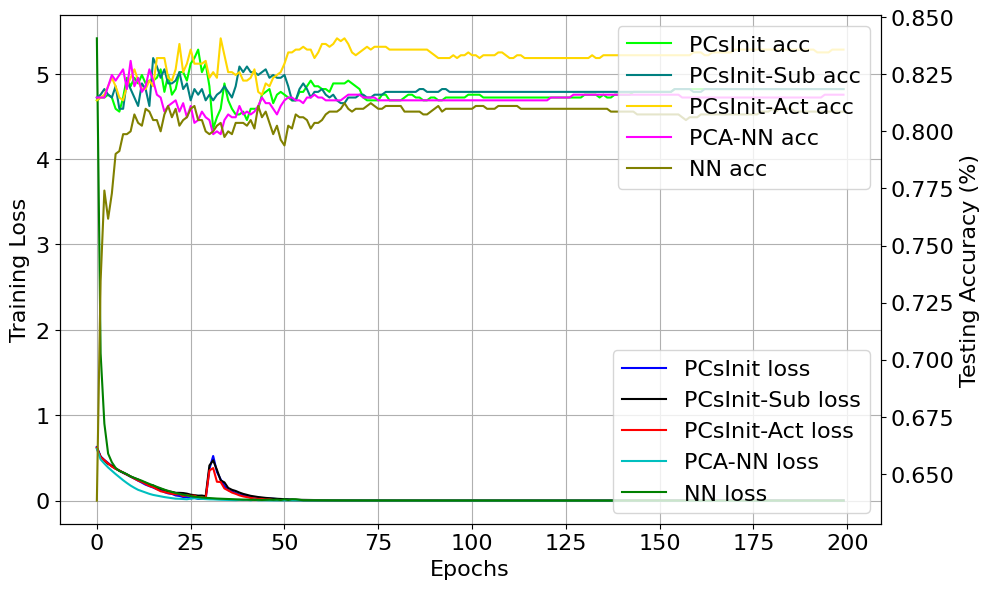

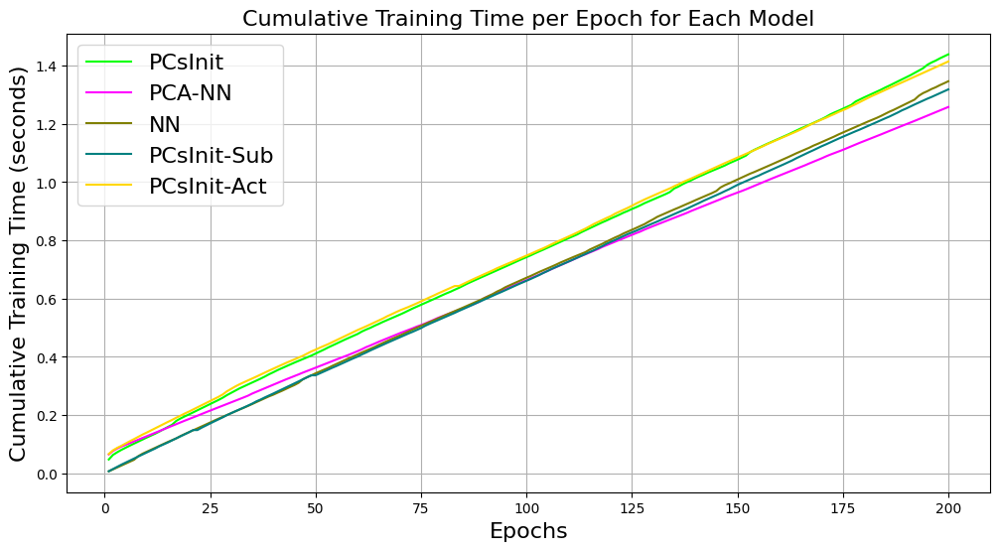

23
Training with PCA-initialized NN...
Number of PCA components: 23
Epoch 1/30, Training Loss: 0.6267, Testing Accuracy: 0.8148, Training Time: 0.0894
Epoch 2/30, Training Loss: 0.5321, Testing Accuracy: 0.8148, Training Time: 0.1043
Epoch 3/30, Training Loss: 0.4760, Testing Accuracy: 0.8148, Training Time: 0.1169
Epoch 4/30, Training Loss: 0.4408, Testing Accuracy: 0.8148, Training Time: 0.1289
Epoch 5/30, Training Loss: 0.4051, Testing Accuracy: 0.8148, Training Time: 0.1421
Epoch 6/30, Training Loss: 0.3735, Testing Accuracy: 0.8148, Training Time: 0.1539
Epoch 7/30, Training Loss: 0.3503, Testing Accuracy: 0.8148, Training Time: 0.1662
Epoch 8/30, Training Loss: 0.3334, Testing Accuracy: 0.8148, Training Time: 0.1811
Epoch 9/30, Training Loss: 0.3104, Testing Accuracy: 0.8148, Training Time: 0.1956
Epoch 10/30, Training Loss: 0.2913, Testing Accuracy: 0.8148, Training Time: 0.2066
Epoch 11/30, Training Loss: 0.2685, Testing Accuracy: 0.8272, Training Time: 0.2161
Epoch 12/30, Trai

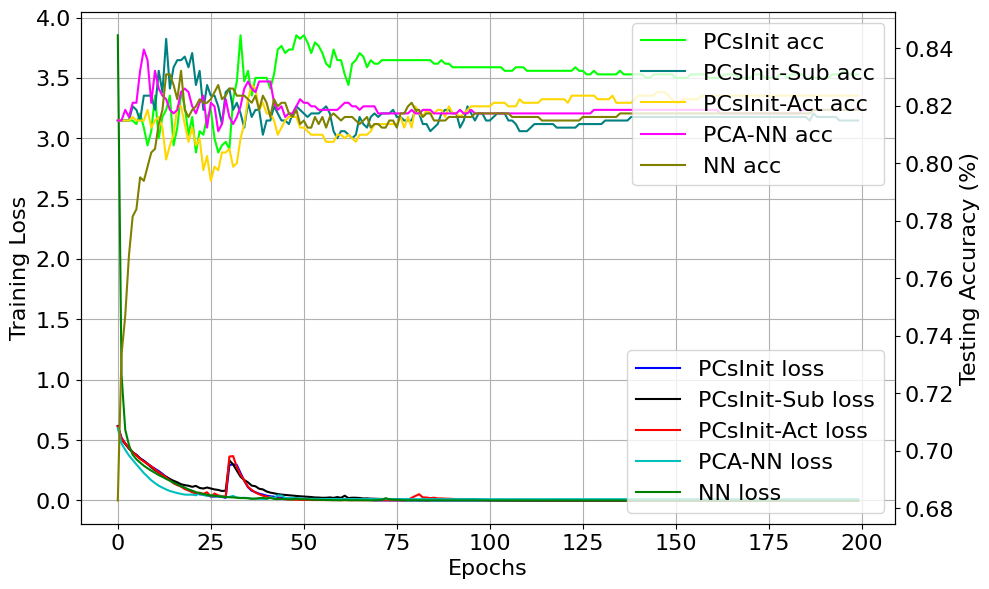

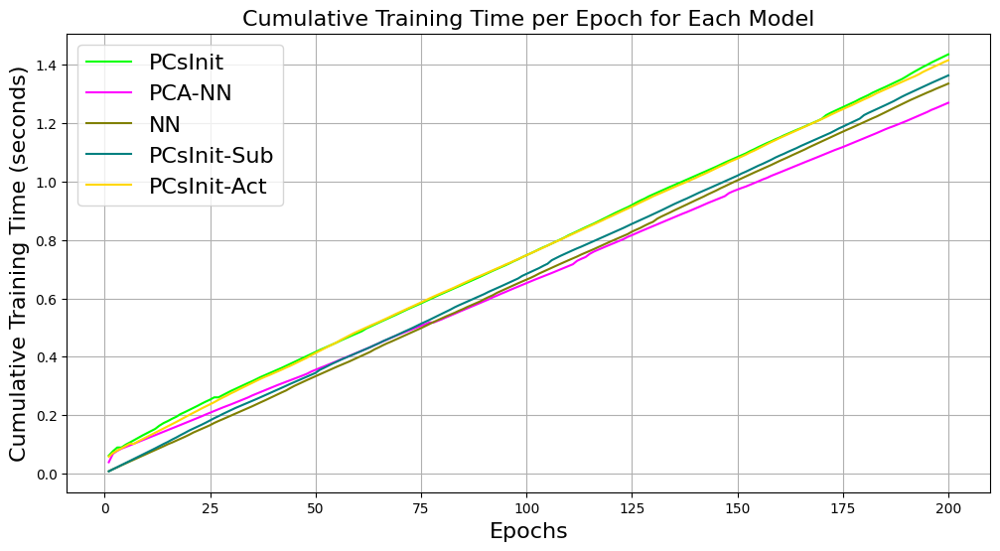

In [3]:
data = pd.read_table('https://archive.ics.uci.edu/ml/machine-learning-databases/spect/SPECTF.train', header = None,sep=',')
print(data.head())
test = pd.read_table('https://archive.ics.uci.edu/ml/machine-learning-databases/spect/SPECTF.test',
                     header=None, sep = ',')
data = pd.concat([data, test])
data = data.to_numpy()
X,y = data[:,1:], data[:,0]
G = len(np.unique(y))
print(np.shape(X))
for g in range(G):
  print(sum(y==g))
X.shape
X = X.astype('float')

run(X, y, 'heart')

# Ionosphere

126
225
22
Training with PCA-initialized NN...
Number of PCA components: 22
Epoch 1/30, Training Loss: 0.7355, Testing Accuracy: 0.8113, Training Time: 0.0108
Epoch 2/30, Training Loss: 0.5054, Testing Accuracy: 0.8679, Training Time: 0.0205
Epoch 3/30, Training Loss: 0.3988, Testing Accuracy: 0.8868, Training Time: 0.0296
Epoch 4/30, Training Loss: 0.3155, Testing Accuracy: 0.9340, Training Time: 0.0381
Epoch 5/30, Training Loss: 0.2569, Testing Accuracy: 0.9151, Training Time: 0.0456
Epoch 6/30, Training Loss: 0.1941, Testing Accuracy: 0.9434, Training Time: 0.0547
Epoch 7/30, Training Loss: 0.1489, Testing Accuracy: 0.9528, Training Time: 0.0639
Epoch 8/30, Training Loss: 0.1205, Testing Accuracy: 0.9434, Training Time: 0.0713
Epoch 9/30, Training Loss: 0.0965, Testing Accuracy: 0.9434, Training Time: 0.0802
Epoch 10/30, Training Loss: 0.0817, Testing Accuracy: 0.9434, Training Time: 0.0882
Epoch 11/30, Training Loss: 0.0743, Testing Accuracy: 0.9434, Training Time: 0.0978
Epoch 12/

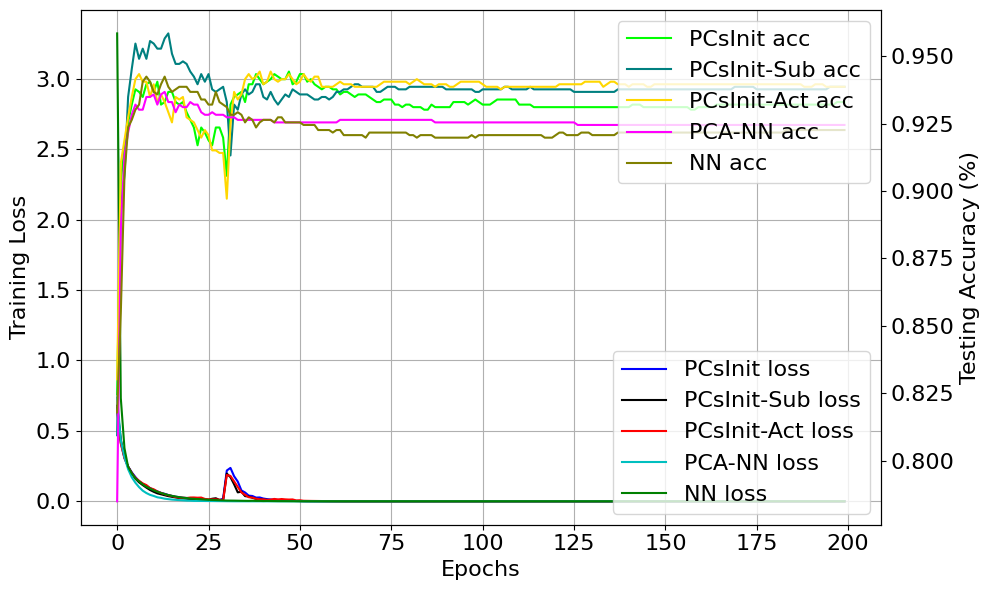

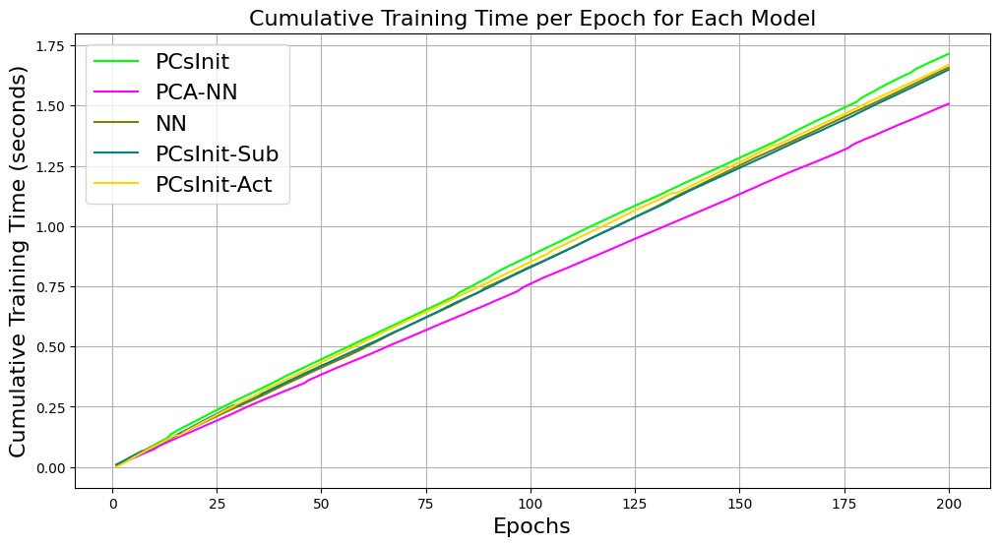

22
Training with PCA-initialized NN...
Number of PCA components: 22
Epoch 1/30, Training Loss: 0.6842, Testing Accuracy: 0.6321, Training Time: 0.0138
Epoch 2/30, Training Loss: 0.5474, Testing Accuracy: 0.8962, Training Time: 0.0247
Epoch 3/30, Training Loss: 0.4107, Testing Accuracy: 0.8774, Training Time: 0.0375
Epoch 4/30, Training Loss: 0.2949, Testing Accuracy: 0.9528, Training Time: 0.0483
Epoch 5/30, Training Loss: 0.2397, Testing Accuracy: 0.9434, Training Time: 0.0577
Epoch 6/30, Training Loss: 0.1830, Testing Accuracy: 0.9434, Training Time: 0.0689
Epoch 7/30, Training Loss: 0.1493, Testing Accuracy: 0.9528, Training Time: 0.0786
Epoch 8/30, Training Loss: 0.1208, Testing Accuracy: 0.9717, Training Time: 0.0888
Epoch 9/30, Training Loss: 0.1222, Testing Accuracy: 0.9623, Training Time: 0.0981
Epoch 10/30, Training Loss: 0.0968, Testing Accuracy: 0.9245, Training Time: 0.1092
Epoch 11/30, Training Loss: 0.0856, Testing Accuracy: 0.9528, Training Time: 0.1177
Epoch 12/30, Trai

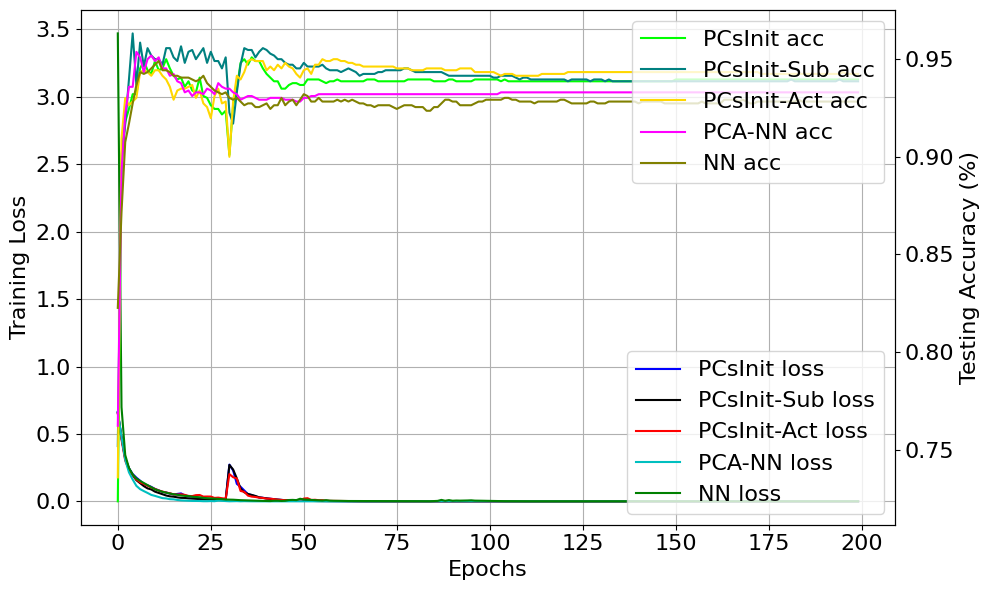

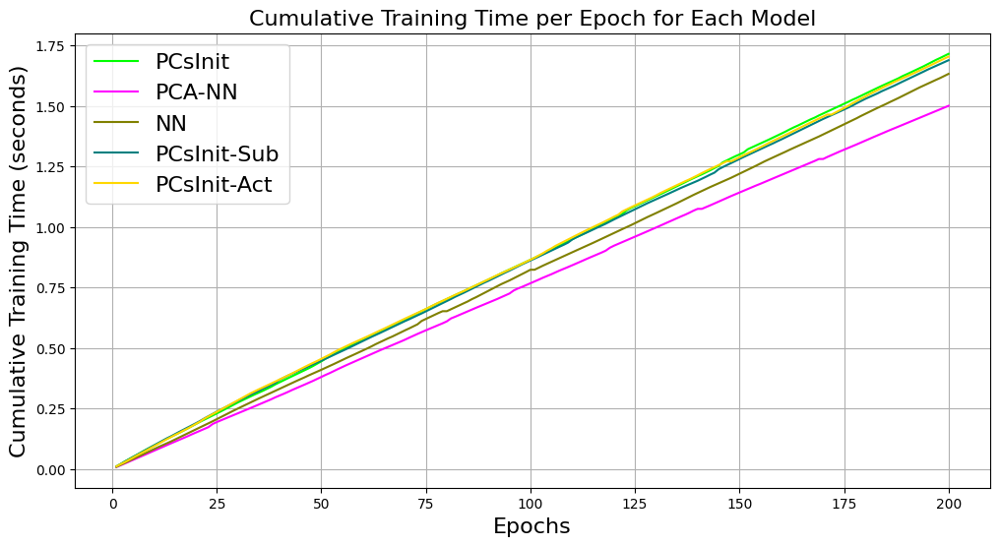

22
Training with PCA-initialized NN...
Number of PCA components: 22
Epoch 1/30, Training Loss: 0.6249, Testing Accuracy: 0.6321, Training Time: 0.0116
Epoch 2/30, Training Loss: 0.4800, Testing Accuracy: 0.9340, Training Time: 0.0427
Epoch 3/30, Training Loss: 0.3094, Testing Accuracy: 0.9245, Training Time: 0.0530
Epoch 4/30, Training Loss: 0.2107, Testing Accuracy: 0.9245, Training Time: 0.0602
Epoch 5/30, Training Loss: 0.1809, Testing Accuracy: 0.8962, Training Time: 0.0673
Epoch 6/30, Training Loss: 0.1869, Testing Accuracy: 0.8868, Training Time: 0.0753
Epoch 7/30, Training Loss: 0.1434, Testing Accuracy: 0.9434, Training Time: 0.0836
Epoch 8/30, Training Loss: 0.1331, Testing Accuracy: 0.9151, Training Time: 0.0914
Epoch 9/30, Training Loss: 0.1209, Testing Accuracy: 0.9057, Training Time: 0.0996
Epoch 10/30, Training Loss: 0.1065, Testing Accuracy: 0.9340, Training Time: 0.1084
Epoch 11/30, Training Loss: 0.0962, Testing Accuracy: 0.9151, Training Time: 0.1207
Epoch 12/30, Trai

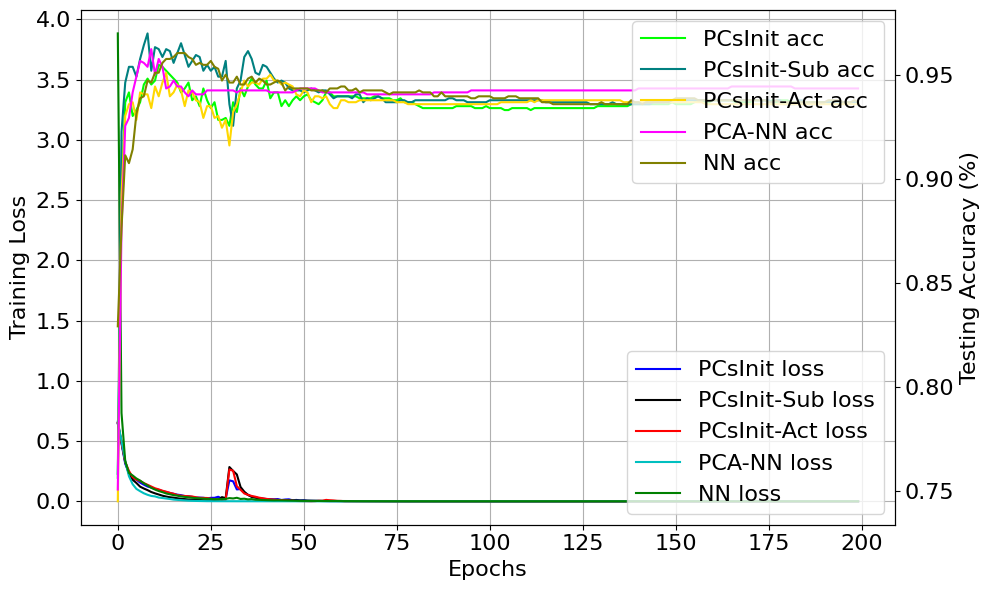

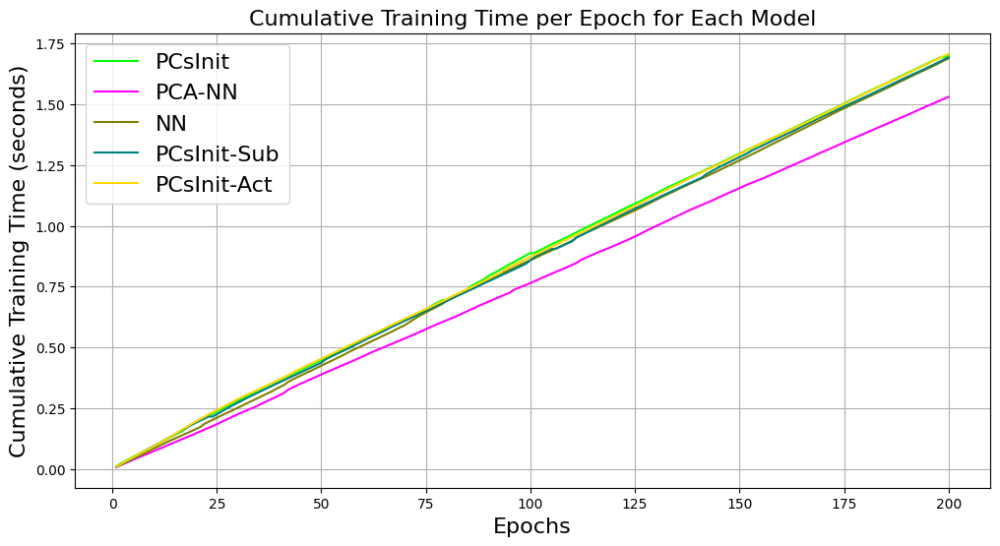

In [4]:
from sklearn.preprocessing import LabelEncoder
data = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/ionosphere/ionosphere.data',
                  sep = ",", header = None)
data = pd.DataFrame.to_numpy(data)
X, y = data[:,:34].astype(np.float64), data[:,34]
le2 = LabelEncoder()
y = le2.fit_transform(y)
G = len(np.unique(y))
X = np.delete(X,[0,1], axis = 1)
for g in range(G):
  print(sum(y==g))
X.shape

run(X, y, 'ionosphere')

# Micromass

In [5]:
label_data = pd.read_csv('data/micromass/mixed_spectra_metadata.csv', sep = ';')
label = label_data[['Mixture_Label']]
label = label.to_numpy()
print(len(np.unique(label)))
le2 = LabelEncoder()
y = le2.fit_transform(label)

df = pd.read_csv('data/micromass/mixed_spectra_matrix.csv', sep = ';', header = None)
print(df.shape)
print(df.head())
X = df.to_numpy()
var_vec = np.array([np.var(X[:,i]) for i in range(X.shape[1])])
id = np.where(var_vec > 1e-5)
X = X[:,id].reshape((len(X),-1))
X.shape

# run(X, y, 'micromass')

10
(360, 1300)
   0     1     2     3     4     5     6     7     8             9     ...  \
0     0   0.0   0.0   0.0   0.0     0   0.0   0.0   0.0      0.000000  ...   
1     0   0.0   0.0   0.0   0.0     0   0.0   0.0   0.0  10162.613281  ...   
2     0   0.0   0.0   0.0   0.0     0   0.0   0.0   0.0      0.000000  ...   
3     0   0.0   0.0   0.0   0.0     0   0.0   0.0   0.0      0.000000  ...   
4     0   0.0   0.0   0.0   0.0     0   0.0   0.0   0.0  15409.125977  ...   

   1290  1291  1292  1293  1294  1295          1296  1297  1298          1299  
0   0.0     0     0   0.0   0.0   0.0      0.000000   0.0   0.0      0.000000  
1   0.0     0     0   0.0   0.0   0.0  11427.124023   0.0   0.0      0.000000  
2   0.0     0     0   0.0   0.0   0.0  12094.415039   0.0   0.0      0.000000  
3   0.0     0     0   0.0   0.0   0.0      0.000000   0.0   0.0      0.000000  
4   0.0     0     0   0.0   0.0   0.0      0.000000   0.0   0.0  35418.402344  

[5 rows x 1300 columns]


/home/pthnhan/miniconda3/envs/pca_init/lib/python3.13/site-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(360, 1087)

# Parkinson

(756, 755)
input shape: (756, 754)
151
Training with PCA-initialized NN...
Number of PCA components: 151
Epoch 1/30, Training Loss: 2.6575, Testing Accuracy: 0.7313, Training Time: 0.1017
Epoch 2/30, Training Loss: 0.5328, Testing Accuracy: 0.7313, Training Time: 0.1375
Epoch 3/30, Training Loss: 0.4454, Testing Accuracy: 0.8326, Training Time: 0.1735
Epoch 4/30, Training Loss: 0.3329, Testing Accuracy: 0.8282, Training Time: 0.2095
Epoch 5/30, Training Loss: 0.2449, Testing Accuracy: 0.7753, Training Time: 0.2463
Epoch 6/30, Training Loss: 0.1928, Testing Accuracy: 0.8018, Training Time: 0.2825
Epoch 7/30, Training Loss: 0.1180, Testing Accuracy: 0.8106, Training Time: 0.3201
Epoch 8/30, Training Loss: 0.0470, Testing Accuracy: 0.7445, Training Time: 0.3604
Epoch 9/30, Training Loss: 0.0435, Testing Accuracy: 0.7709, Training Time: 0.4028
Epoch 10/30, Training Loss: 0.0532, Testing Accuracy: 0.8018, Training Time: 0.4454
Epoch 11/30, Training Loss: 0.0635, Testing Accuracy: 0.8326, Tr

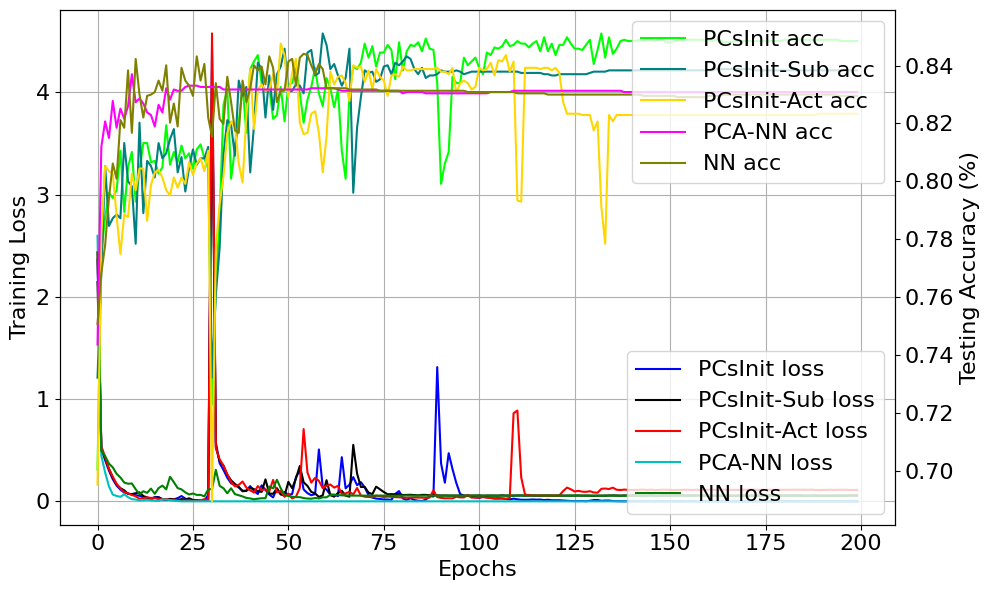

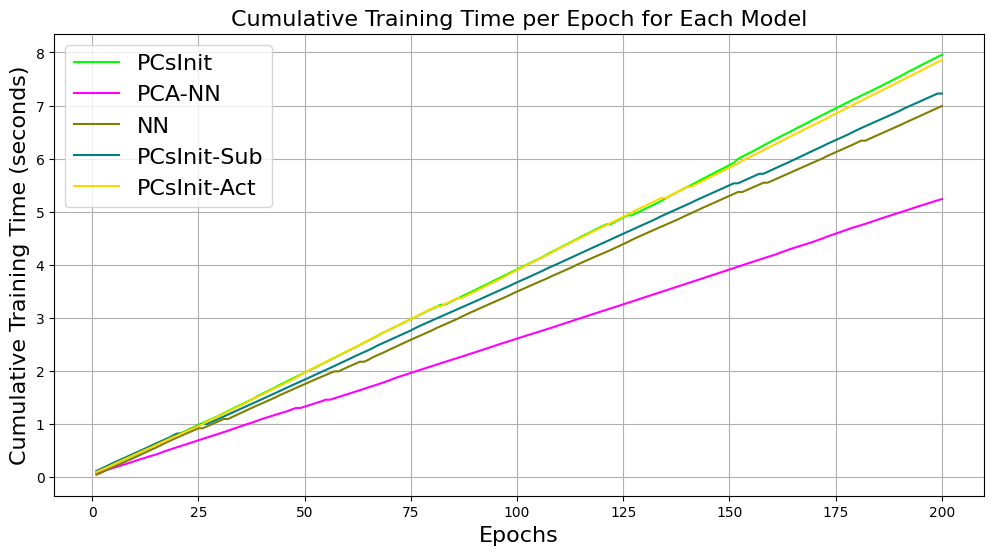

151
Training with PCA-initialized NN...
Number of PCA components: 151
Epoch 1/30, Training Loss: 1.7897, Testing Accuracy: 0.7313, Training Time: 0.1016
Epoch 2/30, Training Loss: 0.4570, Testing Accuracy: 0.7885, Training Time: 0.1346
Epoch 3/30, Training Loss: 0.3890, Testing Accuracy: 0.8062, Training Time: 0.1682
Epoch 4/30, Training Loss: 0.2666, Testing Accuracy: 0.7930, Training Time: 0.2040
Epoch 5/30, Training Loss: 0.1622, Testing Accuracy: 0.8194, Training Time: 0.2405
Epoch 6/30, Training Loss: 0.0972, Testing Accuracy: 0.7974, Training Time: 0.2773
Epoch 7/30, Training Loss: 0.0766, Testing Accuracy: 0.8150, Training Time: 0.3405
Epoch 8/30, Training Loss: 0.0392, Testing Accuracy: 0.7797, Training Time: 0.3755
Epoch 9/30, Training Loss: 0.1138, Testing Accuracy: 0.8018, Training Time: 0.4157
Epoch 10/30, Training Loss: 0.1294, Testing Accuracy: 0.7269, Training Time: 0.4595
Epoch 11/30, Training Loss: 0.1012, Testing Accuracy: 0.7665, Training Time: 0.5628
Epoch 12/30, Tr

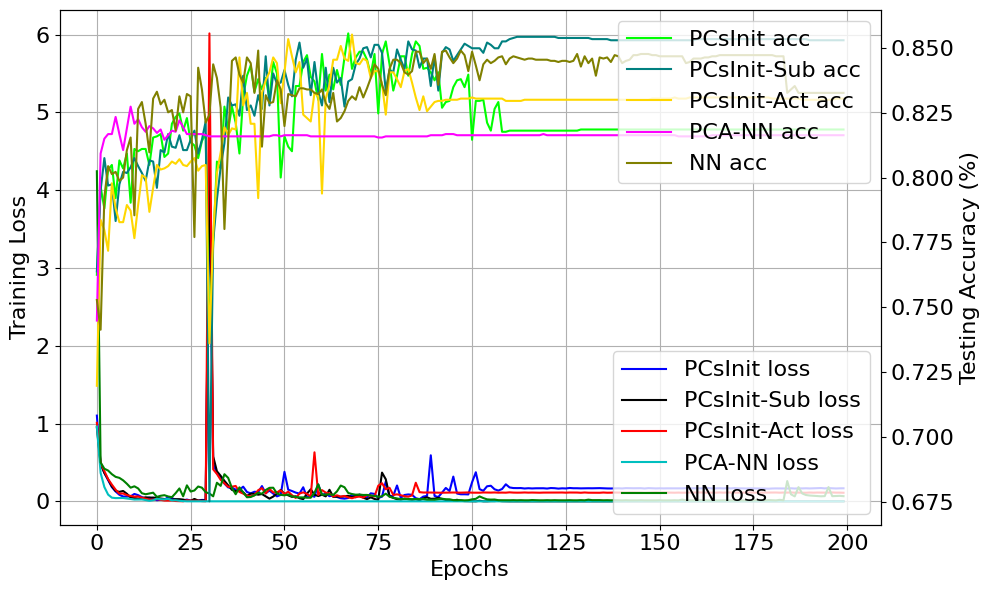

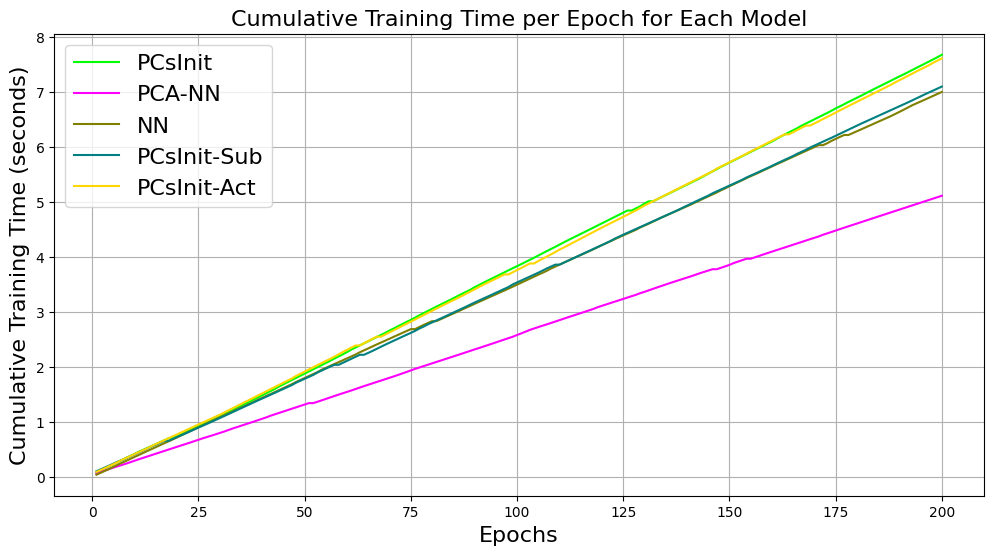

151
Training with PCA-initialized NN...
Number of PCA components: 151
Epoch 1/30, Training Loss: 0.9380, Testing Accuracy: 0.7313, Training Time: 0.1001
Epoch 2/30, Training Loss: 0.5156, Testing Accuracy: 0.7621, Training Time: 0.1347
Epoch 3/30, Training Loss: 0.4756, Testing Accuracy: 0.8238, Training Time: 0.1711
Epoch 4/30, Training Loss: 0.3668, Testing Accuracy: 0.7930, Training Time: 0.2076
Epoch 5/30, Training Loss: 0.3042, Testing Accuracy: 0.8194, Training Time: 0.2456
Epoch 6/30, Training Loss: 0.2017, Testing Accuracy: 0.7930, Training Time: 0.2877
Epoch 7/30, Training Loss: 0.1104, Testing Accuracy: 0.7930, Training Time: 0.3272
Epoch 8/30, Training Loss: 0.0502, Testing Accuracy: 0.7709, Training Time: -0.1713
Epoch 9/30, Training Loss: 0.0814, Testing Accuracy: 0.8062, Training Time: -0.1287
Epoch 10/30, Training Loss: 0.0228, Testing Accuracy: 0.8106, Training Time: -0.0892
Epoch 11/30, Training Loss: 0.0282, Testing Accuracy: 0.7930, Training Time: -0.0526
Epoch 12/30

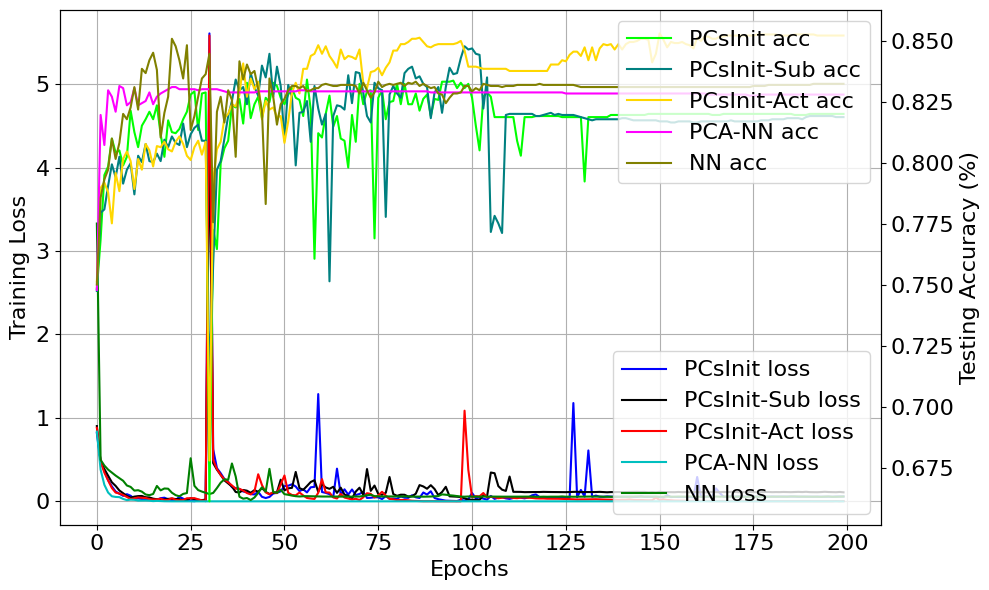

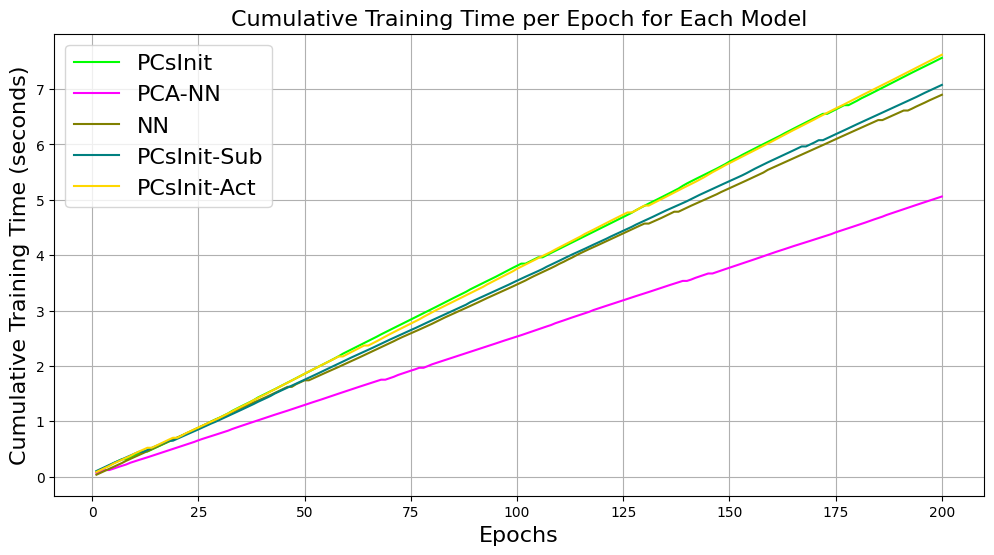

In [6]:
data = pd.read_csv('/home/pthnhan/downloads/experiments_PCAInit/data/pd_speech_features.csv', sep = ",", header = [0,1])
print(data.shape)
data.head()
data = data.to_numpy()
X, y = data[:,:-1], data[:,-1]
G = len(np.unique(y))
print('input shape:', X.shape)

run(X, y, 'parkinson')